# 순환 신경망

* 순환 신경망(Recurrent Neural Network)은 시퀀스(seqence) 데이터를 사용합니다. 
* 시퀀스 데이터란 시계열 데이터라고도 합니다.
    * 시점에 따라 데이터가 달라지는 것을 의미합니다. 
    * 텍스트와 같이 순서에 의미가 있는 데이터도 시퀀스 데이터입니다.
* 즉, 특정 시점의 데이터를 한 번에 수집하는 것이 아닌 시간의 흐름에 따라 데이터도 점차 수집하는 것을 의미합니다. 
* 전체 데이터 셋을 구성하는 각 데이터 포인트의 수집 시점이 서로 다릅니다. 

----------
* 지금까지 다룬 신경망은 입력 데이터를 사용한 후 그 결과가 다시 입력층으로 돌아가지는 않았습니다. 
* 즉 한번 출력된 결과는 다시 사용되지 않았습니다. 이를 피드포워드(feedforward) 신경망이라고 합니다. 
* 순환 신경망은 출력된 결과가 다음 시점에서 사용됩니다. 즉 출력 결과를 다음 시점까지 기억했다가 사용하는 방법입니다.

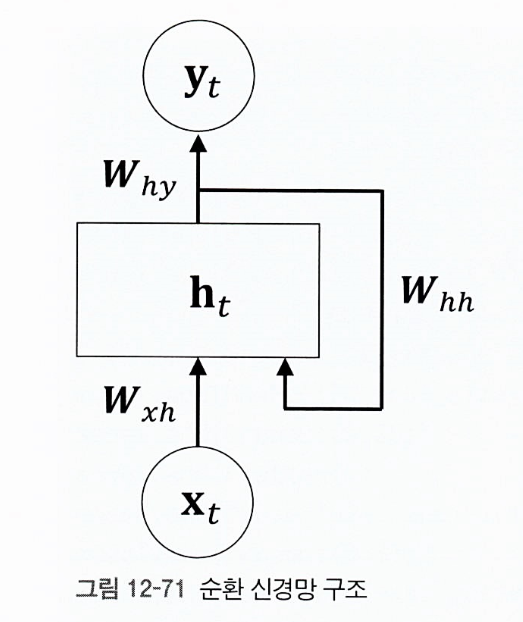

* $ h_t $는 t시점에서의 은닉층(hidden layer)를 의미 
* 화살표의 진행 방향을 보면 알 수 있듯이, 은닉층으로부터 나온 값은 출력값으로 이어질 뿐만 아니라 다시 입력층으로 되돌아가는 방향이 존재 
* 즉 $ h_t $가 재사용된다는 점 
* 아래 그림은 위의 그림을 펼쳐서 표현한 그림이다. 

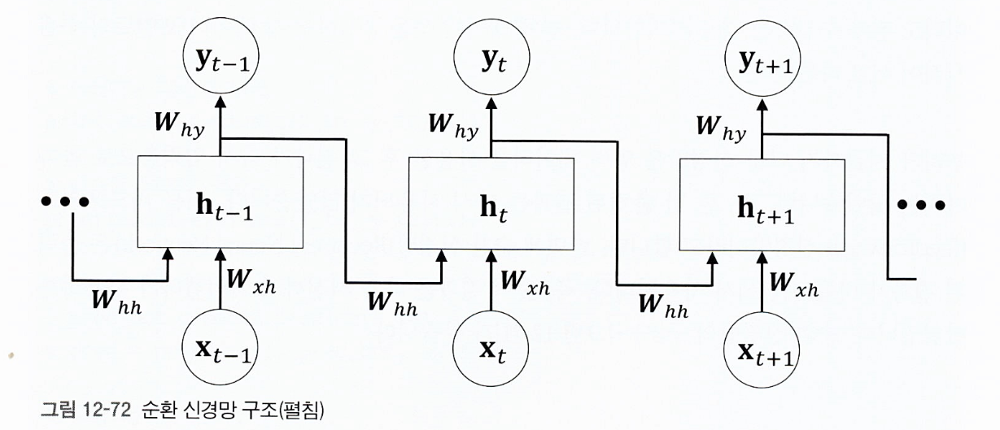

* 각 시점에서 데이터 $ x_t $가 각 은닉층을 통과한 후 각 시점에 대한 결괏값 $ y_t $가 출력

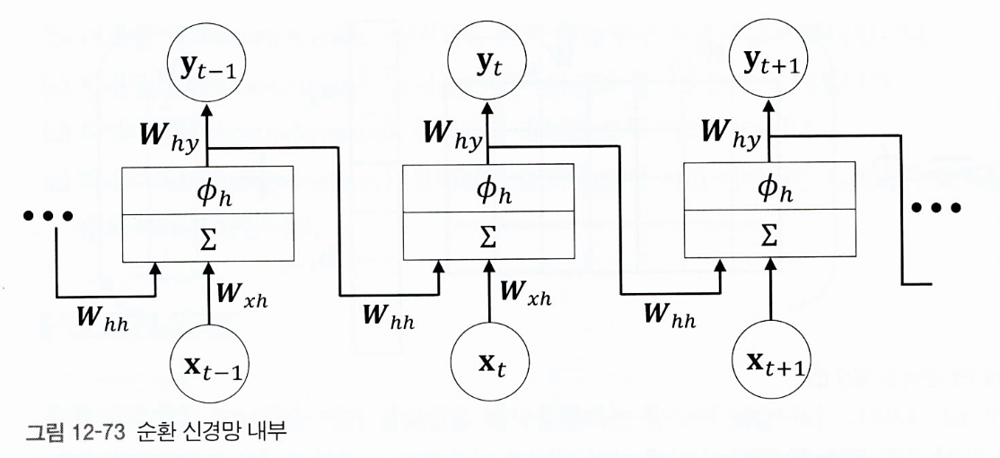

-----------
* 텍스트 데이터는 단어의 순서가 중요한 순차 데이터입니다. 이런 데이터는 순서를 유지하며 신경망에 주입해야 합니다. 
* 단어의 순서를 마구 섞어서 주입하면 안 됩니다. 
* 완전 연결 신경망이나 합성곱 신경망은 이런 기억 장치가 없습니다. 

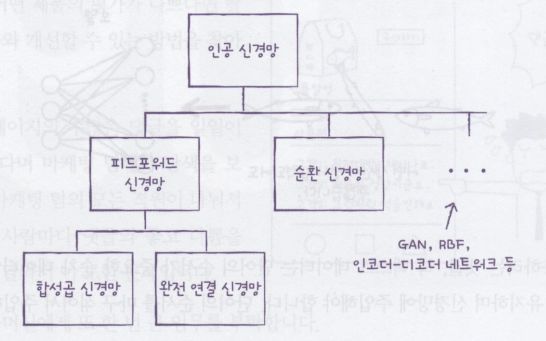

* 다음 샘플을 위해서 이전 데이터가 신경망 층에 순환될 필요가 있습니다. 이런 신경망이 순환 신경망입니다. 

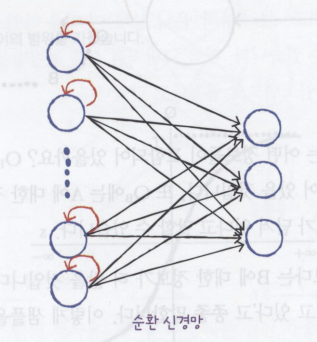

* 완전 연결 신경망에 이전 데이터의 처리 흐름을 순환하는 고리 하나만 추가하면 됩니다. 
* 뉴런의 출력이 다시 자기 자신으로 전달됩니다. 즉 어떤 샘플을 처리할 때 바로 이전에 사용했던 데이터를 재사용 합니다. 

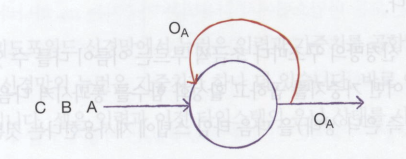

* A, B, C 3개의 샘플을 처리하는 순환 신경망의 뉴런이 있다고 가정해 봅시다. 
* O는 출력된 결과입니다. 
* 위 그림에서 첫 번째 샘플 A를 처리하고 난 출력 ${O_A}$이 다시 뉴런으로 들어갑니다. 
* 이 출력에는 A에 대한 정보가 다분히 들어 있습니다. 그 다음 B를 처리할 때 앞에서 A를 사용해 만든 출력 ${O_A}$를 함께 사용합니다.

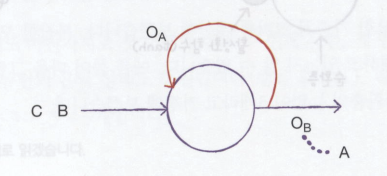

* ${O_A}$와 B를 사용해서 만든 ${O_B}$에는 A에 대한 정보가 어느 정도 포함되어 있을 것입니다. 그 다음 C를 처리할 때는 ${O_B}$를 함께 사용합니다.

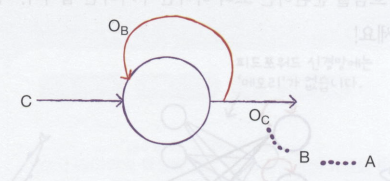

* ${O_B}$를 사용했으므로 당연히 B에 대한 정보가 어느 정도 포함되어 있을 것이며, 또 ${O_B}$에는 A에 대한 정보도 포함되어 있습니다. 
* 따라서 ${O_C}$에 B와 A에 대한 정보가 담겨 있다고 말할 수 있습니다. 
* 물론 ${O_C}$에는 A에 대한 정보보다는 B에 대한 정보가 더 많을 것입니다. 그래서 순환 신경망에서는 '이전 샘플에 대한 기억을 가지고 있다'고 종종 말합니다. 
* 이렇게 샘플을 처리하는 한 단계를 타임스텝(timestep)이라고 말합니다. 
* 순환 신경망은 이전 타임스템의 샘플을 기억하지만 타임스텝이 오래될수록 순환되는 정보는 희미해집니다. 

------------
* 순환 신경망에서는 특별히 층을 셀(cell)이라고 부릅니다. 한 셀에는 여러 개의 뉴런이 있지만 완전 연결 신경망과 달리 뉴런을 모두 표시하지 않고 하나의 셀로 층을 표현합니다. 
* 또 셀의 출력을 은닉 상태(hidden state)라고 부릅니다. 

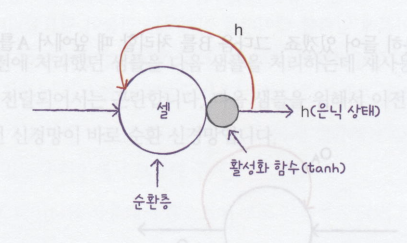

* 입력에 어떤 가중치를 곱하고 활성화 함수를 통과시켜 다음 층으로 보내는 구조는 같음
* 달라지는 것은 층의 출력(즉 은닉상태)을 다음 타임스텝에서 재사용한다는 것입니다.

## 순환 신경망의 활성화 함수
* 일반적으로 은닉층의 활성화 함수로 하이퍼볼릭 탄젠트 함수인 tanh가 많이 사용됩니다. 

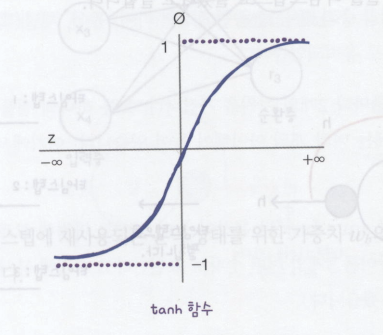

* 순환 신경망 그림에서 번거로움을 피하기 위해 활성화 함수를 따로 표기하지 않습니다. 하지만 순환 신경망에도 활성화 함수가 반드시 필요하다는 것을 꼭 기억해주세요 

### 왜 시그모이드와 Tanh 활성화 함수는 그래디언트 소실 현상을 일으키는가? 
* 시그모이드 함수의 그림에서 알수 있듯이 값이 매우 크거나, 작을 때 출력 값은 0에 가깝게 된다. 
* 시그모이드 함수를 미분하면 $ f'(x) = f(z)(1-f(z)) $ 가 되는데 z가 매우 크거나 매우 작을 때 모두 0에 근사하게 되어 그래디언트 소실 현상이 일어남  
* tanh 함수도 시그모이드와 비슷한 구조를 가지고 있고 미분하면 $ 1 - (f(z))^2 $ 값을 갖고 z의 값이 매우 크거나 작을 때 모두 0에 근사하게 되어 시그모이드처럼 그래디언트 소실 현상이 발생 

### ReLU 계열의 활성화 함수는 시그모이드, tanh 활성화 함수와 비교했을 때 어떤 장점이 있는가?

#### 장점 
* 계산적 관점에서 보면 시그모이드와 tanh 활성화 함수는 평균적으로 복잡도가 높으나, ReLU 활성화 함수는 하나의 임계치만 있으면 활성화 값을 얻을 수 있음 
* ReLU의 비포화성(non-saturation)은 그래디언트 소실 문제를 효과적으로 해결하고, 상대적으로 넓은 활성화 경계를 제공 
* ReLU의 단측면 억제가 네트워크의 희소 표현 능력을 제공 

#### 한계점 
* 훈련 과정에서 뉴런들이 죽는 문제가 발생 
* 음의 그래디언트가 ReLU 유닛을 경과할 때 0이 되어 버려 이후에 어떤 데이터로 활성화되지 않기 때문에, 해당 뉴런을 지나는 그래디언트는 영원히 0이 되어 다른 데이터에 영향을 미치지 않는 것을 의미 
* 실제 훈련 과정에서 학습률을 크게 설정하면 일정 비율의 뉴런이 사망해 파라미터 그래디언트를 업데이트할 수 없어 훈련 과정이 실패하는 경우가 발생 
* 이런 문제를 해결하기 위해서 Leaky ReLU를 사용하기도 함 

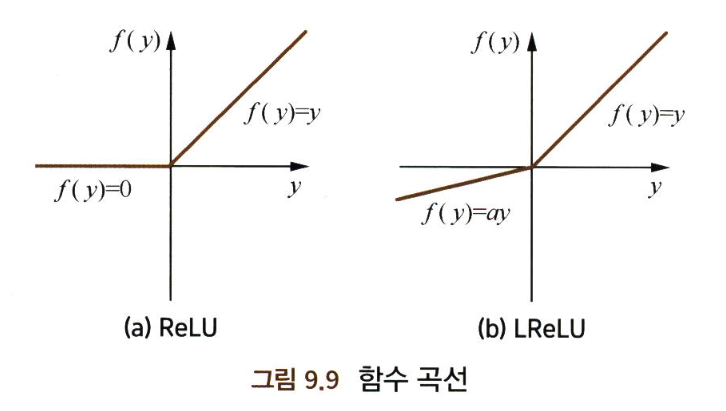

### 순환신경망에서 ReLU를 활성화 함수로 사용해도 되는가?
* 당연히 된다. 하지만 행렬 초깃값에 대한 일정한 제한이 있어야 합니다. 그렇지 않으면 수치 문제가 더 쉽게 발생 

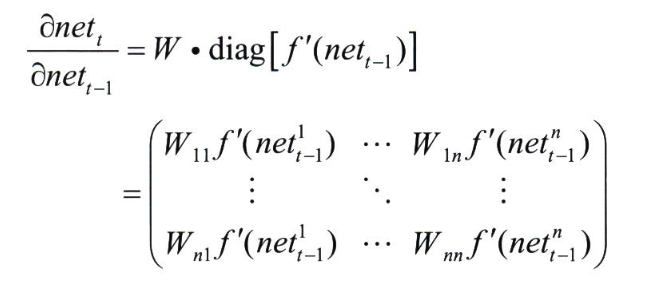

* 순환신경망의 그래디언트 계산 공식에서 ReLU 함수를 사용하고 시작할 때 뉴런이 모두 활성화 상태에 있다고 가정하면 $ diag[f'(net_{t-1} )] $는 단위행렬이 되고 계산된 값은 W가 됩니다. 
* 그래디언트가 n개 층을 거친 후 값은 $ W^n $이 됩니다. 따라서 ReLU 함수를 활성화 함수로 사용한다고 하더라도 W가 단위행렬이 아니면 그래디언트가 소실 혹은 폭발하는 현상이 일어납니다. 
* 순환신경망에서 ReLU 함수를 은닉층의 활성화 함수로 사용한다면, W의 값이 단위행렬로 근사할 때 비교적 좋은 효과를 얻을 수 있음. 따라서 W를 단위행렬로 초기화해야 함 
* W를 단위행렬로 초기화하고 ReLU 활성화 함수를 사용하면 LSTM 모델과 비슷한 결과를 얻을 수 있는 반면, 학습 속도가 LSTM 모델보다 더 빠름

## 순환 신경망 구조

-------
* 순환 신경망의 뉴런은 가중치가 하나 더 있습니다. 바로 이전 타임스텝의 은닉 상태에 곱해지는 가중치입니다. 
* 셀은 입력과 이전 타임스텝의 은닉 상태를 사용하여 현재 타임스텝의 은닉 상태를 만듭니다. 

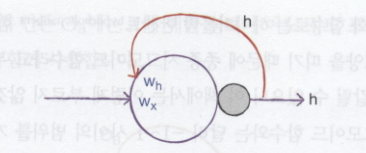

* 위의 그림에서 2개의 가중치를 셀 안에 구분해서 표시하였습니다. ${w_x}$는 입력에 곱해지는 가중치이고 ${w_h}$는 이전 타임스텝의 은닉 상태에 곱해지는 가중치입니다. 피드포워드 신경망과 마찬가지로 뉴런마다 하나의 절편이 포함되어 있지만 따로 표기하지 않습니다.

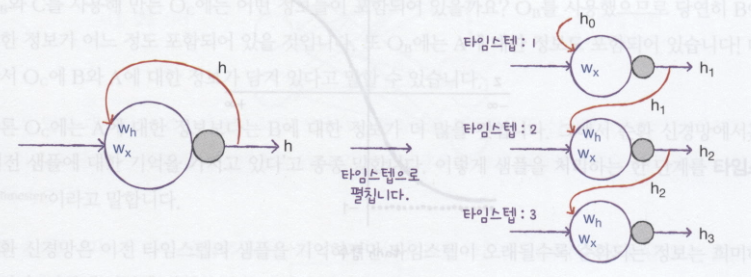

* 셀의 출력(은닉 상태)이 다음 타임스텝에 재사용되기 때문에 타임스텝으로 셀을 나누어 그릴수 있습니다. 
* 위의 그림을 보고 셀을 타임스텝으로 펼쳤다고 합니다. 
-----
* 타임스텝 1에서 셀의 출력 ${h_1}$이 타임스텝 2의 셀로 주입됩니다. 이때 ${w_h}$와 곱해집니다. 
* 마찬가지로 타임스텝 2에서 셀의 출력 ${h_2}$가 타임스텝 3의 셀로 주입됩니다. 이때에도 ${w_h}$와 곱해집니다.
----------
* 여기에서 알 수 있는 것은 모든 타임스텝에서 사용되는 가중치는 ${w_h}$하나라는 점입니다. 
* 가중치 ${w_h}$는 타임스텝에 따라 변화되는 뉴런의 출력을 학습합니다.
* 맨 처음 타임스텝 1에서 사용되는 이전 은닉 상태 ${h_0}$은 입력할 이전 타임스텝이 없기 때문에 0으로 초기화합니다.

## 셀의 가중치와 입출력
* 순환 신경망의 셀에서 필요한 가중치 크기를 계산해보겠습니다. 
* 예를 들어 다음 그림처럼 순환층에 입력되는 특성의 개수가 4개이고 순환층의 뉴런이 3개라고 가정해보겠습니다. 
* ${w_x}$의 크기를 구해 보겠습니다. 
    * 입력층과 순환층의 뉴런이 모두 완전 연결되기 때문에 가중치 ${w_x}$의 크기는 4 x 3 = 12가 됩니다. 

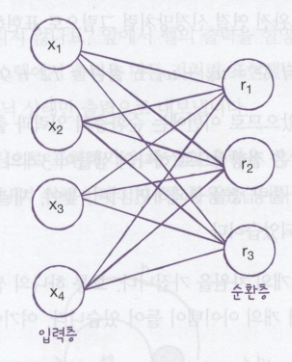

* 순환층에서 다음 타임스텝에서 재사용되는 은닉 상태를 위한 가중치 ${w_h}$의 크기는?

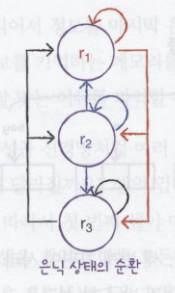

* 순환층에 있는 첫 번째 뉴런 ${r_1}$은 은닉 상태가 다음 타임스텝에 재사용될 때 첫 번째 뉴런과 두 번재 뉴런, 세 번째 뉴런에 모두 전달됩니다. 
* 그림에서 붉은색 표시 
* 이전 타임스텝의 은닉 상태는 다음 타임스텝의 뉴런에 완전히 연결됩니다.

* 두 번째 뉴런의 은닉 상태도 마찬가지로 첫 번째 뉴런과 두 번째 뉴런, 세 번째 뉴런에 모두 전달되고 (파란색 화살표)
* 세 번째 뉴런의 은닉 상태도 동일합니다.(검은 화살표)

* 이 순환층에서 은닉 상태를 위한 가중치 ${w_b}$는 3 x 3 = 9개입니다.
* 따라서 이 순환층은 모두 12 + 9 + 3 = 24개의 모델 파라미터를 가집니다.
    * 편향을 가지기 때문에 3를 더해줍니다.

-----
* 순환층은 일반적으로 샘플마다 2개의 차원을 가집니다. 보통 하나의 샘플을 하나의 시퀀스라고 말합니다. 
* 시퀀스 안에는 여러 개의 아이템이 들어 있습니다. 여기에서 시퀀스의 길이가 바로 타임스텝 길이가 됩니다.
* 예) I am a boy란 문장이 들어 있다고 가정해 봅시다. 
    * 이 샘플은 4개의 단어로 이루어져 있습니다.(타임스텝 크기)
    * 샘플은 1이며, 각 단어는 3개의 벡터로 이루어져 있습니다. 
    * (1, 4, 3)

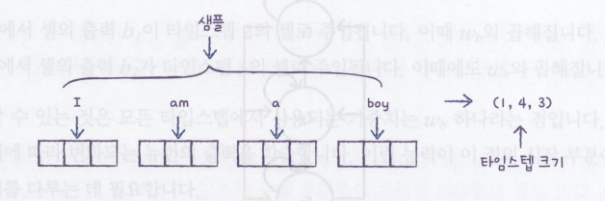

* 입력이 순환층을 통과하면 두 번째, 세 번째 차원이 사라지고 순환층의 뉴런 개수만큼 출력됩니다. 

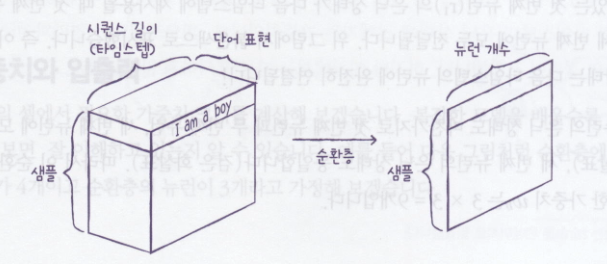

* 하나의 샘플은 시퀀스 길이(여기에서는 단어 개수)와 단어 표현(워드 임베딩)의 2차원 배열입니다. 
* 순환층을 통과하면 1차원 배열로 바뀝니다. 이 1차원 배열의 크기는 순환층의 뉴런 개수에 의해 결정됩니다.
* 순환층은 기본적으로 마지막 타임스텝의 은닉 상태만 출력으로 내보냅니다. 

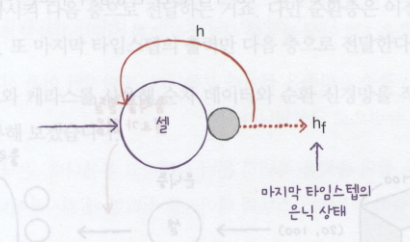

* 입력된 시퀀스 길이를 모두 읽어서 정보를 마지막 은닉 상태에 압축하여 전달하는 것처럼 볼 수 있습니다.
* 이제 순환 신경망이 정보를 기억하는 메모리를 가진다고 표현하는지 이해할 수 있습니다. 또 순환 신경망이 순차 데이터에 잘 맞는 이유를 파악할 수 있습니다.


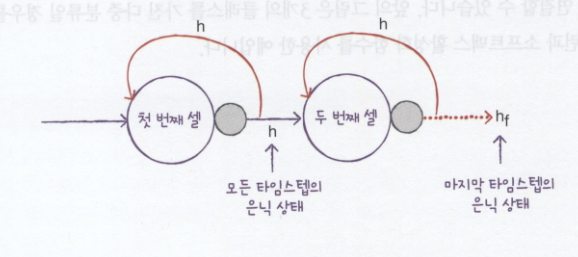

* 순환 신경망도 완전 연결 신경망이나 합성곱 신경망처럼 여러 개의 층으로 쌓을 수 있습니다. 
* 첫 번째 셀은 모든 타임스텝의 은닉 상태를 출력하고, 두 번째 셀은 마지막 타임스텝의 은닉 상태만 출력합니다. 

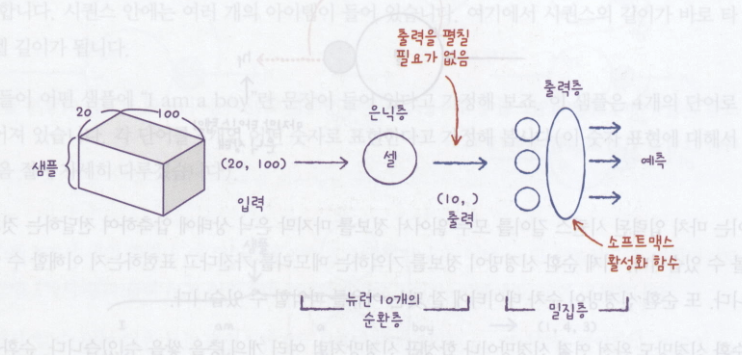

* 출력증의 구성에 대해 알아보겠습니다. 
* 합성곱 신경망과 마찬가지로 순환 신경망도 마지막에는 밀집층을 두어 클래스를 분류합니다. 
    * 다중 분류 -> 출력층에 클래스 개수만큼 뉴런을 두고 소프트맥스 활성화 함수를 사용
    * 이진 분류일 경우에는 하나의 뉴런을 두고 시그모이드 활성화 함수 사용

* 마지막 셀의 출력이 1차원이기 때문에 Flatten 클래스로 펼칠 필요 없이 바로 출력층에 연결할 수 있습니다. 
* 위의 그림은 3개의 클래스를 가진 다중 분류일 경우를 위해 출력층에 3개의 뉴런과 소프트맥스 활성화 함수를 사용한 예입니다.

## 확인문제

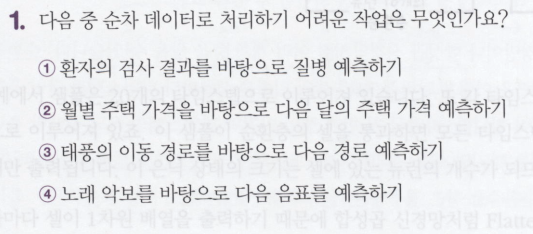

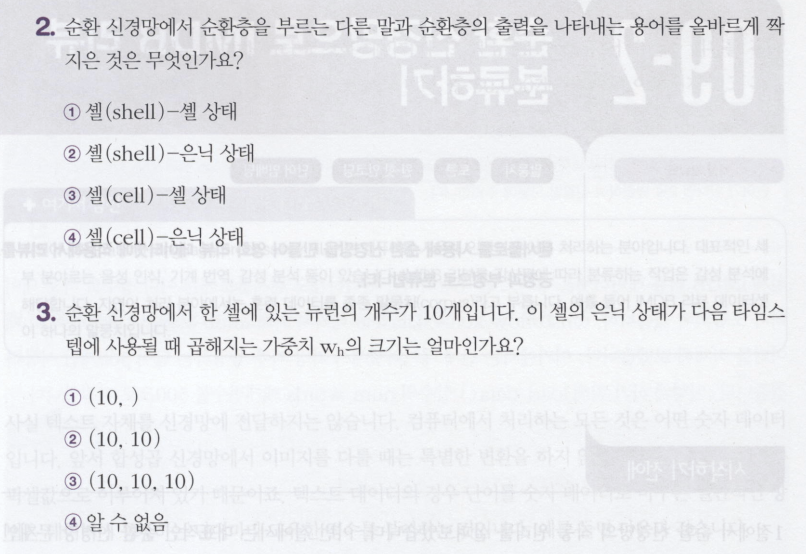

## ------------------ 5월 16일 -------------------

# RNN 실습

### IMDB 리뷰 데이터셋
* 영화 데이터베이스인 imdb.com에서 수집한 리뷰를 감상평에 따라 긍정과 부정으로 분류해 놓은 데이터셋 
* 총 50,000개의 샘플로 이루어져 있고 훈련 데이터와 테스트 데이터에 각각 25,000개씩 나누어져 있습니다.
----
* 자연어 처리 분야에서는 훈련 데이터를 말뭉치(corpus)라고 부릅니다. 

In [3]:
import gzip,shutil

In [6]:
with gzip.open("../data/movie/movie_data.csv.gz", "rb") as f_in, open("../data/movie/m_data.csv", "wb") as f_out:
    shutil.copyfileobj(f_in, f_out) 

In [8]:
import pandas as pd
df = pd.read_csv("../data/movie/m_data.csv")

In [9]:
df

,review,sentiment
0,"In 1974, the teenager Martha Moxley (Maggie Gr...",1
1,OK... so... I really like Kris Kristofferson a...,0
2,"***SPOILER*** Do not read this, if you think a...",0
3,hi for all the people who have seen this wonde...,1
4,"I recently bought the DVD, forgetting just how...",0
...,...,...
49995,"OK, lets start with the best. the building. al...",0
49996,The British 'heritage film' industry is out of...,0
49997,I don't even know where to begin on this one. ...,0
49998,Richard Tyler is a little boy who is scared of...,0


In [10]:
df.review[0]

'In 1974, the teenager Martha Moxley (Maggie Grace) moves to the high-class area of Belle Haven, Greenwich, Connecticut. On the Mischief Night, eve of Halloween, she was murdered in the backyard of her house and her murder remained unsolved. Twenty-two years later, the writer Mark Fuhrman (Christopher Meloni), who is a former LA detective that has fallen in disgrace for perjury in O.J. Simpson trial and moved to Idaho, decides to investigate the case with his partner Stephen Weeks (Andrew Mitchell) with the purpose of writing a book. The locals squirm and do not welcome them, but with the support of the retired detective Steve Carroll (Robert Forster) that was in charge of the investigation in the 70\'s, they discover the criminal and a net of power and money to cover the murder.<br /><br />"Murder in Greenwich" is a good TV movie, with the true story of a murder of a fifteen years old girl that was committed by a wealthy teenager whose mother was a Kennedy. The powerful and rich famil

In [11]:
df.sentiment[0]

1

In [13]:
# collections standard module 기능 
from collections import Counter
c = Counter()
c.update("abc")

In [14]:
c.update(["a", "b"])

In [15]:
c

Counter({'a': 2, 'b': 2, 'c': 1})

In [16]:
c.most_common(1)

[('a', 2)]

In [17]:
import tensorflow as tf
target = df.pop("sentiment")


In [18]:
df

,review
0,"In 1974, the teenager Martha Moxley (Maggie Gr..."
1,OK... so... I really like Kris Kristofferson a...
2,"***SPOILER*** Do not read this, if you think a..."
3,hi for all the people who have seen this wonde...
4,"I recently bought the DVD, forgetting just how..."
...,...
49995,"OK, lets start with the best. the building. al..."
49996,The British 'heritage film' industry is out of...
49997,I don't even know where to begin on this one. ...
49998,Richard Tyler is a little boy who is scared of...


In [19]:
ds_raw = tf.data.Dataset.from_tensor_slices( (df.values, target.values))

In [20]:
ds_raw

<TensorSliceDataset element_spec=(TensorSpec(shape=(1,), dtype=tf.string, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [21]:
for x in ds_raw.take(1):
    tf.print(x[0].numpy()[0], x[1])

(b'In 1974, the teenager Martha Moxley (Maggie Grace) moves to the high-class a'
 b'rea of Belle Haven, Greenwich, Connecticut. On the Mischief Night, eve of Ha'
 b'lloween, she was murdered in the backyard of her house and her murder remain'
 b'ed unsolved. Twenty-two years later, the writer Mark Fuhrman (Christopher Me'
 b'loni), who is a former LA detective that has fallen in disgrace for perjury '
 b'in O.J. Simpson trial and moved to Idaho, decides to investigate the case wi'
 b'th his partner Stephen Weeks (Andrew Mitchell) with the purpose of writing a'
 b' book. The locals squirm and do not welcome them, but with the support of th'
 b'e retired detective Steve Carroll (Robert Forster) that was in charge of the'
 b" investigation in the 70's, they discover the criminal and a net of power an"
 b'd money to cover the murder.<br /><br />"Murder in Greenwich" is a good TV m'
 b'ovie, with the true story of a murder of a fifteen years old girl that was c'
 b'ommitted by a wealthy tee

## 훈련/검증/테스트 셋 분할

In [22]:
tf.random.set_seed(1)

df_raw = ds_raw.shuffle(50000, reshuffle_each_iteration=False)

In [23]:
ds_raw_test = df_raw.take(25000)
ds_raw_train_valid = ds_raw.skip(25000)
ds_raw_train = ds_raw_train_valid.take(20000)
ds_raw_valid = ds_raw_train_valid.skip(20000)

### tokenizer

In [24]:
pip install tensorflow_datasets

  Created wheel for promise: filename=promise-2.3-py3-none-any.whl size=21502 sha256=ec89da9192c79347000e73cd83dec8c6857924e2ff5abf2792da993de702fffc
  Stored in directory: c:\users\82103\appdata\local\pip\cache\wheels\e1\e8\83\ddea66100678d139b14bc87692ece57c6a2a937956d2532608
Successfully built promise
Note: you may need to restart the kernel to use updated packages.


In [25]:
import tensorflow_datasets as tfds

In [26]:
tokenizer = tfds.deprecated.text.Tokenizer()

In [28]:
token_counts = Counter()
for exam in ds_raw_train:
    tokens = tokenizer.tokenize(exam[0].numpy()[0])
    token_counts.update(tokens)

In [29]:
print ("어휘 사전 크기" , len(token_counts))

어휘 사전 크기 86983


In [30]:
sorted(token_counts.items(), key=lambda x : x[1], reverse=True)
encoder = tfds.deprecated.text.TokenTextEncoder(token_counts)

In [31]:
encoder.encode("Hello Movie")

[11732, 355]

In [32]:
encoder.encode("Hello")

[11732]

In [ ]:
encoder.encode("")

In [ ]:
encoder.encode("")

In [33]:
pip install pyprind

Note: you may need to restart the kernel to use updated packages.


In [35]:
import pyprind
import pandas as pd
from string import punctuation
import re
import numpy as np


df = pd.read_csv('../data/movie/m_data.csv', encoding='utf-8')
print(df.head(3))

                                              review  sentiment
0  In 1974, the teenager Martha Moxley (Maggie Gr...          1
1  OK... so... I really like Kris Kristofferson a...          0
2  ***SPOILER*** Do not read this, if you think a...          0


In [36]:
## 데이터 전처리:
## 단어를 나누고 등장 횟수를 카운트합니다.

from collections import Counter


counts = Counter()
pbar = pyprind.ProgBar(len(df['review']),
                       title='단어의 등장 횟수를 카운트합니다.')
for i,review in enumerate(df['review']):
    text = ''.join([c if c not in punctuation else ' '+c+' ' \
                    for c in review]).lower()
    df.loc[i,'review'] = text
    pbar.update()
    counts.update(text.split())

단어의 등장 횟수를 카운트합니다.
0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:03:26


In [37]:
punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

dictionary comprehension

In [38]:
## 고유한 각 단어를 정수로 매핑하는
## 딕셔너리를 만듭니다.

word_counts = sorted(counts, key=counts.get, reverse=True)
print(word_counts[:5])
word_to_int = {word: ii for ii, word in enumerate(word_counts, 1)}


mapped_reviews = []
pbar = pyprind.ProgBar(len(df['review']),
                       title='리뷰를 정수로 매핑합니다.')
for review in df['review']:
    mapped_reviews.append([word_to_int[word] for word in review.split()])
    pbar.update()

리뷰를 정수로 매핑합니다.


['the', '.', ',', 'and', 'a']


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:04


In [39]:
word_to_int

{'the': 1,
 '.': 2,
 ',': 3,
 'and': 4,
 'a': 5,
 'of': 6,
 'to': 7,
 "'": 8,
 '/': 9,
 'is': 10,
 '>': 11,
 '<': 12,
 'br': 13,
 'it': 14,
 'in': 15,
 'i': 16,
 'this': 17,
 'that': 18,
 '-': 19,
 '"': 20,
 's': 21,
 'was': 22,
 'as': 23,
 'movie': 24,
 'for': 25,
 'with': 26,
 'but': 27,
 'film': 28,
 ')': 29,
 '(': 30,
 'you': 31,
 't': 32,
 'on': 33,
 'not': 34,
 'he': 35,
 'are': 36,
 'his': 37,
 'have': 38,
 'one': 39,
 'be': 40,
 '!': 41,
 'all': 42,
 'at': 43,
 'they': 44,
 'by': 45,
 'an': 46,
 'who': 47,
 'so': 48,
 'from': 49,
 'like': 50,
 'there': 51,
 'or': 52,
 'just': 53,
 'her': 54,
 'out': 55,
 'about': 56,
 'if': 57,
 'has': 58,
 '?': 59,
 'what': 60,
 'some': 61,
 'good': 62,
 'can': 63,
 'when': 64,
 'more': 65,
 'very': 66,
 'she': 67,
 'up': 68,
 'no': 69,
 'time': 70,
 'my': 71,
 'even': 72,
 'would': 73,
 'which': 74,
 'only': 75,
 'story': 76,
 'really': 77,
 'see': 78,
 'their': 79,
 'had': 80,
 'me': 81,
 'well': 82,
 'we': 83,
 'were': 84,
 ':': 85,
 'than'

In [41]:
mapped_reviews[0] # [0]안하면 너무많음

[15,
 5646,
 3,
 1,
 2160,
 3977,
 26959,
 30,
 4824,
 1575,
 29,
 1133,
 7,
 1,
 316,
 19,
 720,
 1612,
 6,
 6653,
 753,
 3,
 14781,
 3,
 8680,
 2,
 33,
 1,
 14782,
 328,
 3,
 3612,
 6,
 2105,
 3,
 67,
 22,
 1947,
 15,
 1,
 8755,
 6,
 54,
 339,
 4,
 54,
 602,
 4712,
 15343,
 2,
 1732,
 19,
 121,
 170,
 323,
 3,
 1,
 565,
 953,
 25748,
 30,
 1464,
 19622,
 29,
 3,
 47,
 10,
 5,
 1121,
 1099,
 1362,
 18,
 58,
 3040,
 15,
 6002,
 25,
 44343,
 15,
 716,
 2,
 1544,
 2,
 5290,
 3192,
 4,
 1670,
 7,
 21518,
 3,
 1103,
 7,
 3921,
 1,
 434,
 26,
 37,
 1956,
 1801,
 2333,
 30,
 3679,
 3294,
 29,
 26,
 1,
 1285,
 6,
 507,
 5,
 286,
 2,
 1,
 5463,
 10558,
 4,
 92,
 34,
 2568,
 106,
 3,
 27,
 26,
 1,
 1457,
 6,
 1,
 5056,
 1362,
 1320,
 8833,
 30,
 623,
 12704,
 29,
 18,
 22,
 15,
 2762,
 6,
 1,
 3488,
 15,
 1,
 1358,
 8,
 21,
 3,
 44,
 1873,
 1,
 1795,
 4,
 5,
 5000,
 6,
 661,
 4,
 308,
 7,
 999,
 1,
 602,
 2,
 12,
 13,
 9,
 11,
 12,
 13,
 9,
 11,
 20,
 602,
 15,
 14781,
 20,
 10,
 5,
 62,
 255,


In [42]:
## 동일 길이의 시퀀스를 만듭니다.
## 시퀀스 길이가 200보다 작으면 왼쪽에 0이 패딩됩니다.
## 시퀀스 길이가 200보다 크면 마지막 200개 원소만 사용합니다.

sequence_length = 200  ## (RNN 공식에 있는 T 값 입니다)
sequences = np.zeros((len(mapped_reviews), sequence_length), dtype=int)

In [44]:
df.head(3)

,review,sentiment
0,"in 1974 , the teenager martha moxley ( maggi...",1
1,ok . . . so . . . i really like kris kri...,0
2,"* * * spoiler * * * do not read this , ...",0


In [45]:
sequences.shape

(50000, 200)

In [43]:
for i, row in enumerate(mapped_reviews):
    review_arr = np.array(row)
    sequences[i, -len(row):] = review_arr[-sequence_length:]

X_train = sequences[:37500, :]
y_train = df.loc[:37499, 'sentiment'].values
X_test = sequences[37500:, :]
y_test = df.loc[37500:, 'sentiment'].values

In [46]:
df.iloc[0]['review']

'in 1974 ,  the teenager martha moxley  ( maggie grace )  moves to the high - class area of belle haven ,  greenwich ,  connecticut .  on the mischief night ,  eve of halloween ,  she was murdered in the backyard of her house and her murder remained unsolved .  twenty - two years later ,  the writer mark fuhrman  ( christopher meloni )  ,  who is a former la detective that has fallen in disgrace for perjury in o . j .  simpson trial and moved to idaho ,  decides to investigate the case with his partner stephen weeks  ( andrew mitchell )  with the purpose of writing a book .  the locals squirm and do not welcome them ,  but with the support of the retired detective steve carroll  ( robert forster )  that was in charge of the investigation in the 70 \' s ,  they discover the criminal and a net of power and money to cover the murder .  < br  /  >  < br  /  >  " murder in greenwich "  is a good tv movie ,  with the true story of a murder of a fifteen years old girl that was committed by a 

In [47]:
for x in mapped_reviews[0]:
    print(x, end= ', ')

15, 5646, 3, 1, 2160, 3977, 26959, 30, 4824, 1575, 29, 1133, 7, 1, 316, 19, 720, 1612, 6, 6653, 753, 3, 14781, 3, 8680, 2, 33, 1, 14782, 328, 3, 3612, 6, 2105, 3, 67, 22, 1947, 15, 1, 8755, 6, 54, 339, 4, 54, 602, 4712, 15343, 2, 1732, 19, 121, 170, 323, 3, 1, 565, 953, 25748, 30, 1464, 19622, 29, 3, 47, 10, 5, 1121, 1099, 1362, 18, 58, 3040, 15, 6002, 25, 44343, 15, 716, 2, 1544, 2, 5290, 3192, 4, 1670, 7, 21518, 3, 1103, 7, 3921, 1, 434, 26, 37, 1956, 1801, 2333, 30, 3679, 3294, 29, 26, 1, 1285, 6, 507, 5, 286, 2, 1, 5463, 10558, 4, 92, 34, 2568, 106, 3, 27, 26, 1, 1457, 6, 1, 5056, 1362, 1320, 8833, 30, 623, 12704, 29, 18, 22, 15, 2762, 6, 1, 3488, 15, 1, 1358, 8, 21, 3, 44, 1873, 1, 1795, 4, 5, 5000, 6, 661, 4, 308, 7, 999, 1, 602, 2, 12, 13, 9, 11, 12, 13, 9, 11, 20, 602, 15, 14781, 20, 10, 5, 62, 255, 24, 3, 26, 1, 307, 76, 6, 5, 602, 6, 5, 3521, 170, 174, 260, 18, 22, 2373, 45, 5, 3041, 2160, 654, 412, 22, 5, 3129, 2, 1, 976, 4, 994, 244, 347, 79, 2413, 7, 999, 1, 602, 25, 65, 8

In [48]:
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(37500, 200) (37500,) (12500, 200) (12500,)


In [49]:
n_words = len(word_to_int) + 1
print(n_words)

102967


In [50]:
from tensorflow.keras import models, layers

In [55]:
model = models.Sequential()

model.add(layers.Embedding(n_words, 200, 
                           embeddings_regularizer='l2'))
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_4 (Embedding)     (None, None, 200)         20593400  
                                                                 
Total params: 20,593,400
Trainable params: 20,593,400
Non-trainable params: 0
_________________________________________________________________


* 텍스트 자체를 신경망에 전달하지는 않습니다. 컴퓨터에서 처리하는 모든 것은 어떤 숫자 데이터입니다. 
* 앞서 합성곱 신경망에서 이미지를 다룰 때는 특별한 변환을 하지 않았습니다. 이미지는 픽셀값으로 이루어져 있기 때문입니다. 
* 텍스트 데이터의 경우 단어를 숫자 데이터로 바꾸는 일반적인 방법은 데이터에 등장하는 단어마다 고유한 정수를 부여하는 것입니다. 

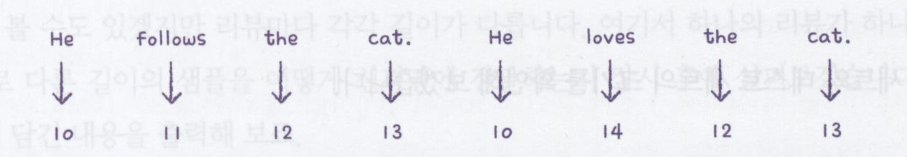

* 이렇게 분리된 단어를 토큰(token)이라고 부릅니다. 하나의 샘플은 여러 개의 토큰으로 이루어져 있고 1개의 토큰이 하나의 타임스탬프에 해당합니다. 

In [56]:
from tensorflow.keras.datasets import imdb

(train_input, train_target), (test_input, test_target) = imdb.load_data(num_words=500)

In [57]:
print(train_input.shape, test_input.shape)

(25000,) (25000,)


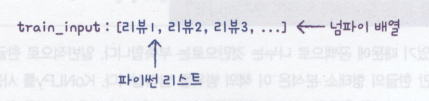

* IMDB 리뷰 텍스트는 길이가 제각각입니다. 따라서 고정 크기의 2차원 배열에 담기보다는 리뷰마다 별도의 파이선 리스트로 담아야 메모리를 효율적으로 사용할 수 있습니다. 
* 아래처럼 리뷰의 길이를 출력해보면 다른 길이를 가진 것을 확인할 수 있습니다.

In [58]:
print(len(train_input[0]))

218


In [59]:
print(len(train_input[1]))

189


* 첫번째 리뷰에 담긴 내용을 출력해 보겠습니다.
* num_words = 500으로 지정했기 때문에 어휘 사전에는 500개의 단어만 들어가 있습니다. 따라서 어휘 사전에 없는 단어는 모두 2로 표시됩니다.
    * 500개의 단어는 빈도수 기준으로..

In [5]:
print(train_input[0])

[1, 14, 22, 16, 43, 2, 2, 2, 2, 65, 458, 2, 66, 2, 4, 173, 36, 256, 5, 25, 100, 43, 2, 112, 50, 2, 2, 9, 35, 480, 284, 5, 150, 4, 172, 112, 167, 2, 336, 385, 39, 4, 172, 2, 2, 17, 2, 38, 13, 447, 4, 192, 50, 16, 6, 147, 2, 19, 14, 22, 4, 2, 2, 469, 4, 22, 71, 87, 12, 16, 43, 2, 38, 76, 15, 13, 2, 4, 22, 17, 2, 17, 12, 16, 2, 18, 2, 5, 62, 386, 12, 8, 316, 8, 106, 5, 4, 2, 2, 16, 480, 66, 2, 33, 4, 130, 12, 16, 38, 2, 5, 25, 124, 51, 36, 135, 48, 25, 2, 33, 6, 22, 12, 215, 28, 77, 52, 5, 14, 407, 16, 82, 2, 8, 4, 107, 117, 2, 15, 256, 4, 2, 7, 2, 5, 2, 36, 71, 43, 2, 476, 26, 400, 317, 46, 7, 4, 2, 2, 13, 104, 88, 4, 381, 15, 297, 98, 32, 2, 56, 26, 141, 6, 194, 2, 18, 4, 226, 22, 21, 134, 476, 26, 480, 5, 144, 30, 2, 18, 51, 36, 28, 224, 92, 25, 104, 4, 226, 65, 16, 38, 2, 88, 12, 16, 283, 5, 16, 2, 113, 103, 32, 15, 16, 2, 19, 178, 32]


In [60]:
print(train_target[:20])

[1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 1 1 0 1]


In [61]:
from sklearn.model_selection import train_test_split

train_input, val_input, train_target, val_target = train_test_split(
    train_input, train_target, test_size=0.2, random_state=42)

In [62]:
import numpy as np

lengths = np.array([len(x) for x in train_input])

In [63]:
print(np.mean(lengths), np.median(lengths))

239.00925 178.0


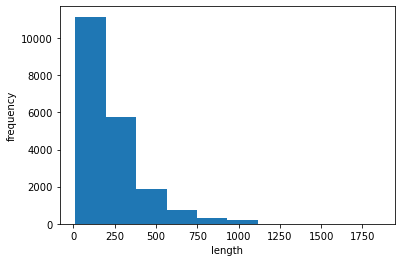

In [64]:
import matplotlib.pyplot as plt

plt.hist(lengths)
plt.xlabel('length')
plt.ylabel('frequency')
plt.show()

* 리뷰 데이터를 길이가 100이 되도록 잘라내거나 0으로 패딩
* pad_sequences() 함수가 제공
* 길이를 100으로 설정

In [65]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

train_seq = pad_sequences(train_input, maxlen=100)

In [66]:
val_seq = pad_sequences(val_input, maxlen=100)

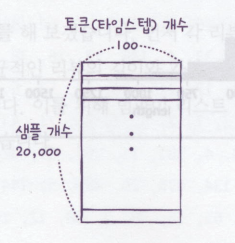

In [67]:
print (train_seq.shape)

(20000, 100)


print(train_seq[0])

In [68]:
print(train_input[0][-10:])

[6, 2, 46, 7, 14, 20, 10, 10, 470, 158]


* 데이터가 길이보다 작다면 0으로 패딩합니다.

* 데이터를 확인해보면 maxlen보다 긴 시퀀스의 앞부분을 자릅니다. 이렇게 하는 이유는 일반적으로 시퀀스의 뒷부분의 정보가 더 유용하리라 기대하기 때문입니다. 
* 뒷부분을 자르고 싶다면 truncating 매개변수의 값을 기본값 pre가 아닌 post로 바꾸면 됩니다. 

## 순환 신경망 만들기

In [69]:
from tensorflow import keras

model = keras.Sequential()

model.add(keras.layers.SimpleRNN(8, input_shape=(100, 500)))
model.add(keras.layers.Dense(1, activation='sigmoid'))

In [70]:
train_seq.shape

(20000, 100)

In [71]:
train_oh = keras.utils.to_categorical(train_seq)

train_seq[1]

In [72]:
train_oh[1]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.]], dtype=float32)

In [78]:
train_oh[1].shape

(100, 500)

In [73]:
print(train_oh.shape)

(20000, 100, 500)


In [74]:
print(train_oh[0][0][:10])

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [75]:
print(np.sum(train_oh[0][0]))

1.0


In [76]:
val_oh = keras.utils.to_categorical(val_seq)

In [77]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 8)                 4072      
                                                                 
 dense (Dense)               (None, 1)                 9         
                                                                 
Total params: 4,081
Trainable params: 4,081
Non-trainable params: 0
_________________________________________________________________


* 입력 토큰은 500차원의 원-핫 인코딩 배열입니다.
* 이 배열이 순환층의 뉴런 8개와 완전히 연결되기 때문에 총 500 x 8 = 4000
* 이 은닉 상태도 순환층의 뉴런과 완전히 연결되기 때문에 8(은닉 상태 크기) x 8(뉴런의 개수) = 64개의 가중치가 필요합니다. 
* 4,000 + 64 + 8 = 4072 
* 출력층에서는 하나의 출력 1로 8개의 은닉층의 모으기 때문에 8개 + 1개의 편향 = 9개가 됩니다.

### 훈련하기

In [79]:
rmsprop = keras.optimizers.RMSprop(learning_rate=1e-4)
model.compile(optimizer=rmsprop, loss='binary_crossentropy', 
              metrics=['accuracy'])

checkpoint_cb = keras.callbacks.ModelCheckpoint('best-simplernn-model.h5')
early_stopping_cb = keras.callbacks.EarlyStopping(patience=3,
                                                  restore_best_weights=True)

history = model.fit(train_oh, train_target, epochs=100, batch_size=64,
                    validation_data=(val_oh, val_target),
                    callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/100
313/313 [==============================] - 11s 27ms/step - loss: 0.6962 - accuracy: 0.5105 - val_loss: 0.6955 - val_accuracy: 0.5100
Epoch 2/100
313/313 [==============================] - 8s 25ms/step - loss: 0.6850 - accuracy: 0.5508 - val_loss: 0.6807 - val_accuracy: 0.5690
Epoch 3/100
313/313 [==============================] - 8s 24ms/step - loss: 0.6689 - accuracy: 0.6083 - val_loss: 0.6660 - val_accuracy: 0.6194
Epoch 4/100
313/313 [==============================] - 8s 25ms/step - loss: 0.6523 - accuracy: 0.6418 - val_loss: 0.6485 - val_accuracy: 0.6536
Epoch 5/100
313/313 [==============================] - 8s 25ms/step - loss: 0.6333 - accuracy: 0.6720 - val_loss: 0.6296 - val_accuracy: 0.6760
Epoch 6/100
313/313 [==============================] - 8s 25ms/step - loss: 0.6119 - accuracy: 0.6960 - val_loss: 0.6072 - val_accuracy: 0.6946
Epoch 7/100
313/313 [==============================] - 8s 25ms/step - loss: 0.5883 - accuracy: 0.7156 - val_loss: 0.5829 - val_accuracy

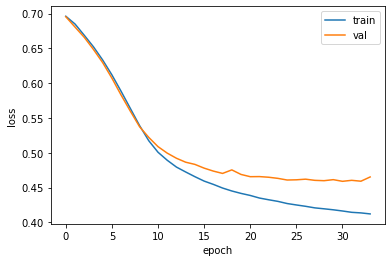

In [80]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train', 'val'])
plt.show()

In [76]:
print (train_seq.nbytes, train_oh.nbytes)

8000000 4000000000


In [34]:
6400000 * 500

3200000000

## 단어 임베딩 사용하기 
* 순환 신경망에서 텍스트를 처리할 때 즐겨 사용하는 방법은 단어 임베딩(word embedding)입니다. 
* 단어 임베딩은 각 단어를 고정된 크기의 실수 벡터로 바꾸어 줍니다. 

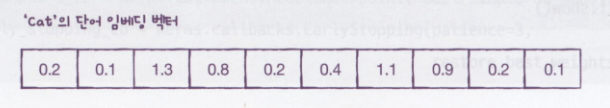

* 이런 단어 임베딩으로 만들어진 벡터는 원-핫 인코딩 된 벡터보다 휠씬 의미 있는 값으로 채워져 있기 때문에 자연처 처리에서 더 좋은 성능을 내는 경우가 많습니다. 
* 물론 이런 단어 임베딩 벡터를 만드는 층은 준비되어 있습니다. 

help(keras.layers.Embedding)

In [81]:
model2 = keras.Sequential()

model2.add(keras.layers.Embedding(500, 16, input_length=100))
model2.add(keras.layers.SimpleRNN(8))
model2.add(keras.layers.Dense(1, activation='sigmoid'))

model2.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_5 (Embedding)     (None, 100, 16)           8000      
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 8)                 200       
                                                                 
 dense_1 (Dense)             (None, 1)                 9         
                                                                 
Total params: 8,209
Trainable params: 8,209
Non-trainable params: 0
_________________________________________________________________


* Embedding 클래스의 첫 번째 매개변수(500)는 어휘 사전의 크기입니다. 
* IMDB 리뷰 데이터셋에서 500개의 단어만 사용할도록 imdb.load_data(num_words=500)과 같이 설정했기 때문에 이 매개변수의 값을 500으로 지정합니다.
* 두 번째 매개변수(16)는 임베딩 벡터의 크기입니다. 
    * 원-핫 인코딩보다 휠씬 작은 크기 (16)의 벡터를 사용했습니다.
* 세 번째 input_length 매개변수는 입력 시퀀스의 길이입니다. 따라서 이 값을 100으로 지정합니다. 

----------
* 500개의 각 토큰의 크기가 16인 벡터로 변경되기 때문에 500 x 16 = 8000 
* simple_rnn층은 임베딩 벡터의 크기가 16이므로 8개의 뉴런과 곱하기 위해서 필요한 가중치 16 x 8 = 128개를 가집니다. 
* 은닉 상태에 곱해지는 가중치 8 x 8 = 64개가 있습니다. 
* 마지막 8개의 절편이 있으므로 128 + 64 + 8 = 200개 입니다. 

In [28]:
train_seq.shape

(20000, 100)

In [82]:
rmsprop = keras.optimizers.RMSprop(learning_rate=1e-4)
model2.compile(optimizer=rmsprop, loss='binary_crossentropy', 
               metrics=['accuracy'])

checkpoint_cb = keras.callbacks.ModelCheckpoint('best-embedding-model.h5')
early_stopping_cb = keras.callbacks.EarlyStopping(patience=3,
                                                  restore_best_weights=True)

history = model2.fit(train_seq, train_target, epochs=100, batch_size=64,
                     validation_data=(val_seq, val_target),
                     callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/100
313/313 [==============================] - 7s 18ms/step - loss: 0.6953 - accuracy: 0.5094 - val_loss: 0.6946 - val_accuracy: 0.5086
Epoch 2/100
313/313 [==============================] - 5s 17ms/step - loss: 0.6775 - accuracy: 0.5876 - val_loss: 0.6642 - val_accuracy: 0.6432
Epoch 3/100
313/313 [==============================] - 5s 18ms/step - loss: 0.6467 - accuracy: 0.6823 - val_loss: 0.6397 - val_accuracy: 0.6930
Epoch 4/100
313/313 [==============================] - 5s 17ms/step - loss: 0.6221 - accuracy: 0.7135 - val_loss: 0.6195 - val_accuracy: 0.7106
Epoch 5/100
313/313 [==============================] - 5s 17ms/step - loss: 0.5995 - accuracy: 0.7337 - val_loss: 0.6003 - val_accuracy: 0.7262
Epoch 6/100
313/313 [==============================] - 5s 15ms/step - loss: 0.5784 - accuracy: 0.7491 - val_loss: 0.5835 - val_accuracy: 0.7334
Epoch 7/100
313/313 [==============================] - 5s 15ms/step - loss: 0.5595 - accuracy: 0.7606 - val_loss: 0.5687 - val_accuracy:

* 임베딩 되어 속도가 훨씬 빠름

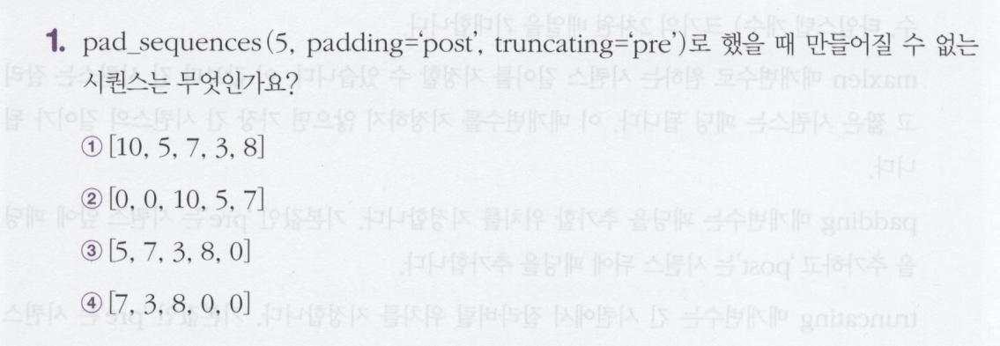

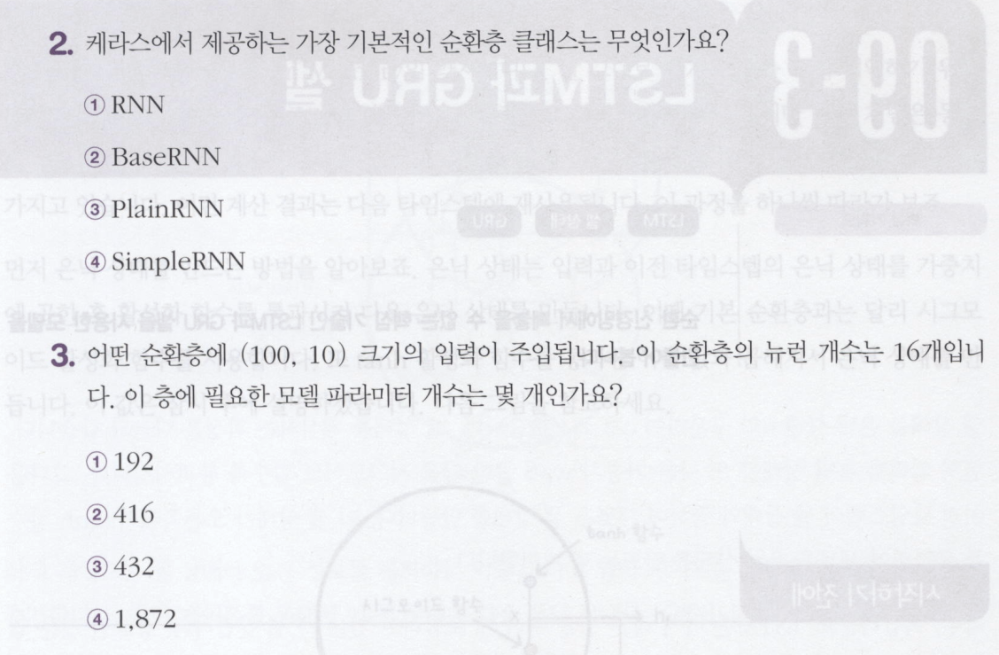

## ------------------ 5월 16일 ------------------- 끝

# LSTM과 GRU 셀

* simpleRNN보다 계산이 휠씬 복잡합니다. 하지만 성능이 뛰어나기 때문에 순환 신경망에서 많이 채택되고 있습니다. 
* 일반적으로 기분 순환층은 긴 시퀀스를 학습하기 어렵습니다. 시퀀스가 길수록 순환되는 은닉 상태에 담긴 정보가 점차 희석되기 때문입니다. 
* 따라서 멀리 떨어져 있는 단어 정보를 인식하는 데 어려울 수 있습니다. 
* 이를 위해서 LSTM과 GRU 셀이 발명되었습니다.

-----------------------
* 순환 싱경망은 은닉층을 거친 결과값을 재사용하는 특징 때문에 그래디언트 소실 문제(vanishing gradient problem)이나 그래디언트 폭주 문제(exploding gradient problem)이 발생할 수 있습니다. 
* LSTM은 이 두가지 문제를 해결하기 위해서 만든 방법입니다. 
* LSTM에서는 결과값이 다음 시점으로 넘어갈 때 결과값을 넘길지 말지 결정하는 단계가 추가됩니다. 
    * 소실은 학습이 진행되는 과정에서 그래디언트가 점점 줄어들어 사라지는 현상
    * 폭주는 그래디언트가 점점 커져서 폭주하는 현상

## LSTM 구조
* Long Short-Term Memory의 약자입니다. 
* 말 그대로 단기 기억을 오래 기억하기 위해서 고안되었습니다. LSTM은 구조가 복잡합니다. 
* 순환 신경망은 은닉층을 거친 결괏값을 재사용하는 특징으로 인하여 그래디언트가 소실 혹은 폭주하는 문제가 발생합니다. 
* LSTM은 그래디언트 폭주나 소실 문제를 해결하기 위한 방법이기도 함 

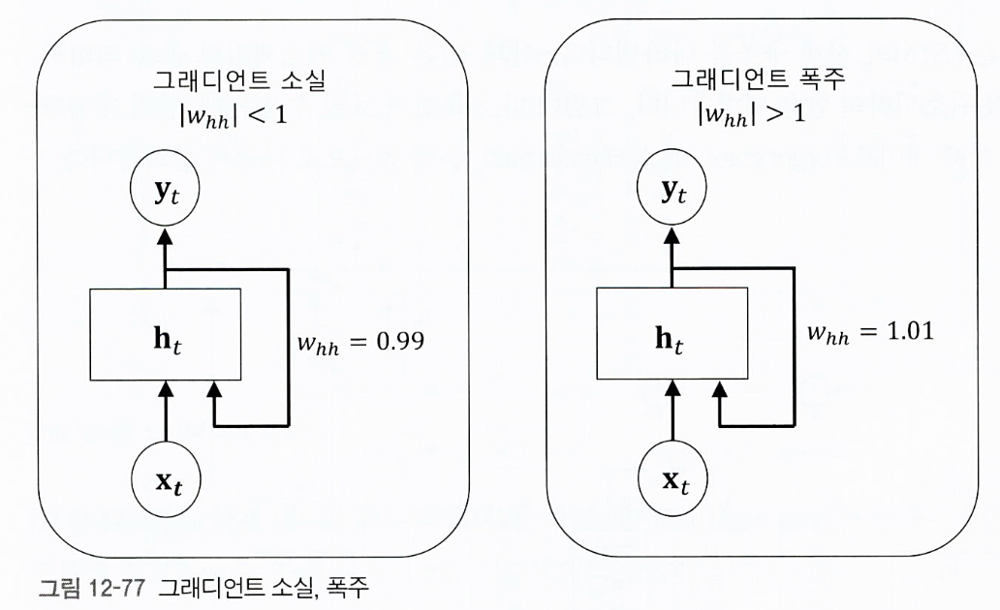

* 입력과 가중치를 곱하고 절편을 더해 활성화 함수를 통과시키는 구조를 여러 개 가지고 있습니다. 
* 이 계산 결과는 다음 타임스텝에 재사용됩니다. 

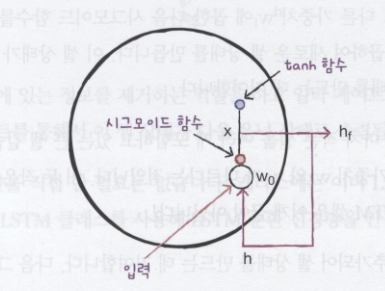

* 은닉 상태는 입력과 이전 타임스텝의 은닉 상태를 가중치에 곱한 후 활성화 함수를 통과시켜 다음 은닉 상태를 만듭니다. 
* 이때 기본 순환층과는 달리 시그모이드 활성화 함수를 사용합니다. 
* 또 tanh 활성화 함수를 통과한 어떤 값과 곱해져서 은닉 상태를 만듭니다. 
* 편의상 은닉 상태를 계산할 때 사용하는 가중치 ${w_x}$와 ${w_h}$를 통틀어 ${w_o}$라고 표시했습니다. 
* 파란색 원은 tanh 함수를 나타내고 주황색 원은 시그모이드 함수를 나타냅니다. 
* x는 곱셈을 나타냅니다. 
------------------
* LSTM에서 순환되는 상태가 2개입니다. 은닉 상태 말고 셀 상태(cell state)라고 부르는 값이 또 있습니다. 
* 은닉 상태와 달리 셀 상태는 다음 층으로 전달되지 않고 LSTM 셀에서 순환만 되는 값입니다. 

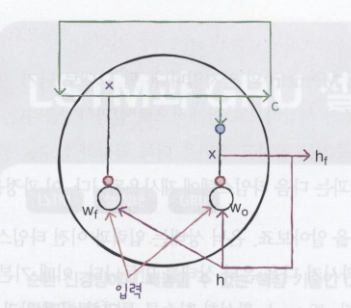

* 위 그림에서 초록색으로 순환되는 셀 상태가 표시되어 있습니다. 
* 셀 상태를 은닉 상태 h와 구분하여 c로 표시했습니다. 셀 상태를 계산하는 과정은 다음과 같습니다. 
* 먼저 입력과 은닉 상태를 또 다른 가중치 ${w_f}$에 곱한 다음 시그모이드 함수를 통과시킵니다.
* 그 다음 이전 타임스텝의 셀 상태와 곱하여 새로운 셀 상태를 만듭니다. 
* 이 셀 상태가 오른쪽에서 tanh 함수를 통과하여 새로운 은닉 상태를 만드는데 기여합니다. 

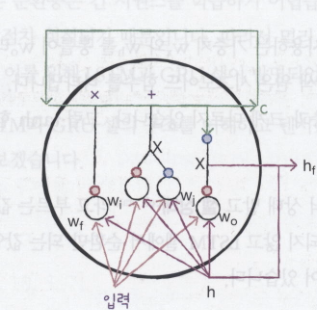

* 여기에 2개의 작은 셀이 더 추가되어 셀 상태를 만드는데 기여합니다. 
* 입력과 은닉 상태를 각기 다른 가중치를 곱한 다음, 하나는 시그모이드 함수를 통과시키고 다른 하나는 tanh 함수를 통과시킵니다. 
* 두 결과를 곱한 후 이전 셀 상태와 더합니다. 
* 이 결과가 최종적인 다음 셀 상태가 됩니다.

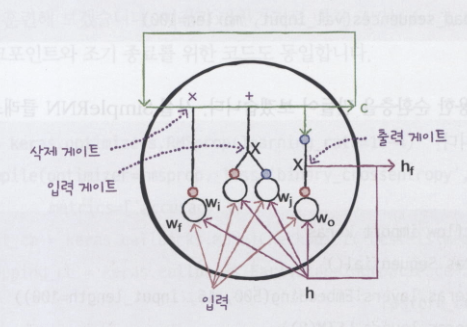

* 세 군데의 곱셈을 왼쪽부터 차례대로 삭제 케이트, 입력 게이트, 출력 게이트라고 부릅니다. 
* 삭제 게이트는 셀 상태에 있는 정보를 제거하는 역할을 하고 입력 게이트는 새로운 정보를 셀 상태에 추가합니다. 
* 출력 게이트를 통해서 이 셀 상태가 다음 은닉 상태로 출력됩니다. 

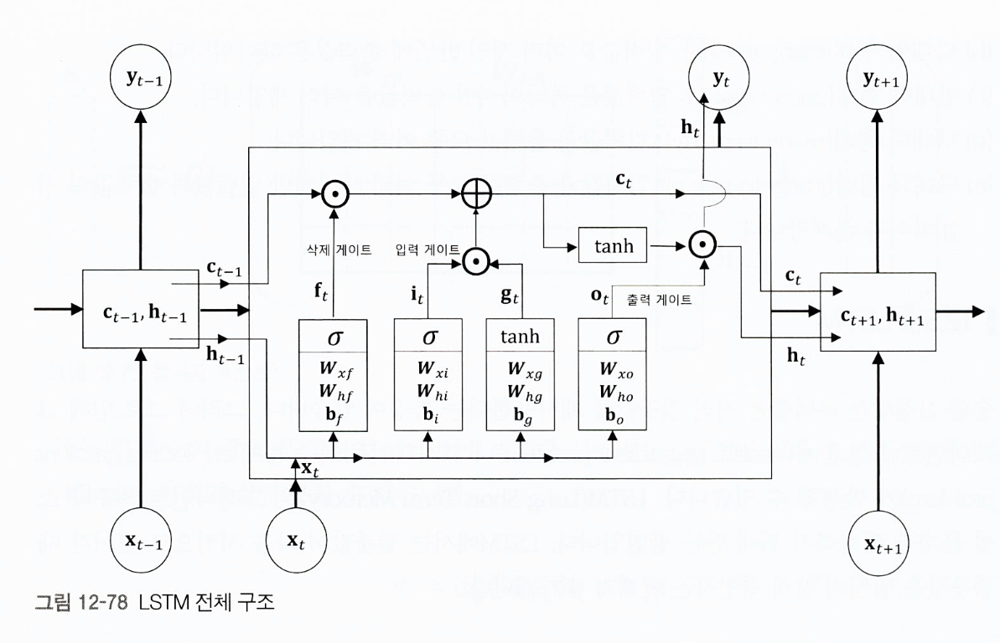

### LSTM 신경망 훈련하기

In [1]:
from tensorflow.keras.datasets import imdb
from sklearn.model_selection import train_test_split

(train_input, train_target), (test_input, test_target) = imdb.load_data(
    num_words=500)

train_input, val_input, train_target, val_target = train_test_split(
    train_input, train_target, test_size=0.2, random_state=42)

In [2]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

train_seq = pad_sequences(train_input, maxlen=100)
val_seq = pad_sequences(val_input, maxlen=100)

In [3]:
from tensorflow import keras

model = keras.Sequential()

model.add(keras.layers.Embedding(500, 16, input_length=100))
model.add(keras.layers.LSTM(8))
model.add(keras.layers.Dense(1, activation='sigmoid'))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 100, 16)           8000      
                                                                 
 lstm (LSTM)                 (None, 8)                 800       
                                                                 
 dense (Dense)               (None, 1)                 9         
                                                                 
Total params: 8,809
Trainable params: 8,809
Non-trainable params: 0
_________________________________________________________________


* LSTM 셀에는 작은 셀이 4개 있으므로 정확히 4개가 늘어 모델 파라미터의 개수는 800개가 되었습니다. 

In [4]:
rmsprop = keras.optimizers.RMSprop(learning_rate=1e-4)
model.compile(optimizer=rmsprop, loss='binary_crossentropy', 
              metrics=['accuracy'])

checkpoint_cb = keras.callbacks.ModelCheckpoint('best-lstm-model.h5')
early_stopping_cb = keras.callbacks.EarlyStopping(patience=3,
                                                  restore_best_weights=True)

history = model.fit(train_seq, train_target, epochs=100, batch_size=64,
                    validation_data=(val_seq, val_target),
                    callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/100
313/313 [==============================] - 12s 31ms/step - loss: 0.6926 - accuracy: 0.5354 - val_loss: 0.6920 - val_accuracy: 0.5658
Epoch 2/100
313/313 [==============================] - 9s 29ms/step - loss: 0.6905 - accuracy: 0.6093 - val_loss: 0.6889 - val_accuracy: 0.6256
Epoch 3/100
313/313 [==============================] - 9s 29ms/step - loss: 0.6836 - accuracy: 0.6520 - val_loss: 0.6744 - val_accuracy: 0.6828
Epoch 4/100
313/313 [==============================] - 9s 30ms/step - loss: 0.6373 - accuracy: 0.7022 - val_loss: 0.6032 - val_accuracy: 0.7216
Epoch 5/100
313/313 [==============================] - 9s 29ms/step - loss: 0.5912 - accuracy: 0.7282 - val_loss: 0.5839 - val_accuracy: 0.7242
Epoch 6/100
313/313 [==============================] - 9s 29ms/step - loss: 0.5703 - accuracy: 0.7407 - val_loss: 0.5670 - val_accuracy: 0.7378
Epoch 7/100
313/313 [==============================] - 10s 32ms/step - loss: 0.5526 - accuracy: 0.7521 - val_loss: 0.5509 - val_accurac

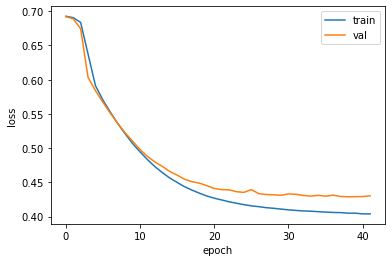

In [5]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train', 'val'])
plt.show()

### 순환층에 드롭아웃 적용하기
* 완전 연결 신경망과 합성곱 신경망에서는 Dropout 클래스를 사용해 드롭아웃을 적용했습니다.
* 이를 통해 모델이 훈련 데이터에 너무 과대접합되는 것을 방지했습니다. 
* 순환층 자체적으로 드롭아웃 기능을 제공합니다. 

---------------
* dropout 매개변수는 셀의 입력에 드롭아웃을 적용하고 recurrent_dropout은 순환되는 은닉 상태에 드롭아웃을 적용합니다. 
* recurrent_dropout를 사용하면 GPU를 사용하여 훈련하지 못합니다. 

In [6]:
model2 = keras.Sequential()

model2.add(keras.layers.Embedding(500, 16, input_length=100))
model2.add(keras.layers.LSTM(8, dropout=0.3))
model2.add(keras.layers.Dense(1, activation='sigmoid'))

In [7]:
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 100, 16)           8000      
                                                                 
 lstm_1 (LSTM)               (None, 8)                 800       
                                                                 
 dense_1 (Dense)             (None, 1)                 9         
                                                                 
Total params: 8,809
Trainable params: 8,809
Non-trainable params: 0
_________________________________________________________________


In [8]:
rmsprop = keras.optimizers.RMSprop(learning_rate=1e-4)
model2.compile(optimizer=rmsprop, loss='binary_crossentropy', 
               metrics=['accuracy'])

checkpoint_cb = keras.callbacks.ModelCheckpoint('best-dropout-model.h5')
early_stopping_cb = keras.callbacks.EarlyStopping(patience=3,
                                                  restore_best_weights=True)

history = model2.fit(train_seq, train_target, epochs=100, batch_size=64,
                     validation_data=(val_seq, val_target),
                     callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/100
313/313 [==============================] - 12s 33ms/step - loss: 0.6921 - accuracy: 0.5483 - val_loss: 0.6913 - val_accuracy: 0.5646
Epoch 2/100
313/313 [==============================] - 10s 31ms/step - loss: 0.6887 - accuracy: 0.6083 - val_loss: 0.6860 - val_accuracy: 0.6358
Epoch 3/100
313/313 [==============================] - 10s 32ms/step - loss: 0.6790 - accuracy: 0.6546 - val_loss: 0.6697 - val_accuracy: 0.6742
Epoch 4/100
313/313 [==============================] - 10s 31ms/step - loss: 0.6375 - accuracy: 0.6869 - val_loss: 0.5895 - val_accuracy: 0.7278
Epoch 5/100
313/313 [==============================] - 10s 31ms/step - loss: 0.5749 - accuracy: 0.7304 - val_loss: 0.5536 - val_accuracy: 0.7450
Epoch 6/100
313/313 [==============================] - 10s 33ms/step - loss: 0.5470 - accuracy: 0.7463 - val_loss: 0.5354 - val_accuracy: 0.7548
Epoch 7/100
313/313 [==============================] - 11s 34ms/step - loss: 0.5266 - accuracy: 0.7570 - val_loss: 0.5131 - val_ac

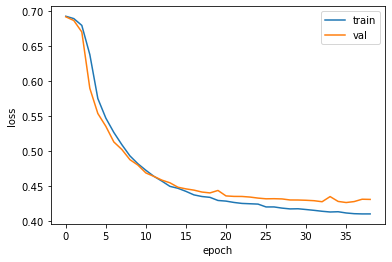

In [9]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train', 'val'])
plt.show()

### 2개의 층을 연결하기 
* 순환층의 은닉 상태는 샘플의 마지막 타임스탭에 대한 은닉 상태만 다음 층으로 전달합니다. 
* 하지만 순환층을 쌓게 되면 모든 순환층에 순차 데이터가 필요합니다. 
* 따라서 앞쪽의 순환층이 모든 타임스텝에 대한 은닉 상태를 출력해야 합니다. 
* 오직 마지막 순환층만 마지막 타임스텝의 은닉 상태를 출력해야 합니다. 

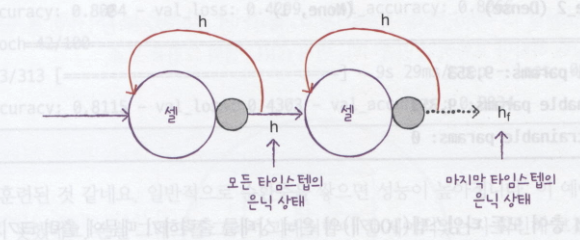

In [10]:
model3 = keras.Sequential()

model3.add(keras.layers.Embedding(500, 16, input_length=100))
model3.add(keras.layers.LSTM(8, dropout=0.3, return_sequences=True))
model3.add(keras.layers.LSTM(8, dropout=0.3))
model3.add(keras.layers.Dense(1, activation='sigmoid'))

model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 100, 16)           8000      
                                                                 
 lstm_2 (LSTM)               (None, 100, 8)            800       
                                                                 
 lstm_3 (LSTM)               (None, 8)                 544       
                                                                 
 dense_2 (Dense)             (None, 1)                 9         
                                                                 
Total params: 9,353
Trainable params: 9,353
Non-trainable params: 0
_________________________________________________________________


* 두번째 lstm의 파라미터는 (8 * 8 + 64 + 8) * 4

* 첫 번째 LSTM 클래스에는 return_sequences 매개변수를 True로 지정하여 모든 타임스텝의 은닉 상태를 출력하였습니다.

In [11]:
rmsprop = keras.optimizers.RMSprop(learning_rate=1e-4)
model3.compile(optimizer=rmsprop, loss='binary_crossentropy', 
               metrics=['accuracy'])

checkpoint_cb = keras.callbacks.ModelCheckpoint('best-2rnn-model.h5')
early_stopping_cb = keras.callbacks.EarlyStopping(patience=3,
                                                  restore_best_weights=True)

history = model3.fit(train_seq, train_target, epochs=100, batch_size=64,
                     validation_data=(val_seq, val_target),
                     callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/100
313/313 [==============================] - 22s 61ms/step - loss: 0.6929 - accuracy: 0.5214 - val_loss: 0.6924 - val_accuracy: 0.5482
Epoch 2/100
313/313 [==============================] - 20s 64ms/step - loss: 0.6912 - accuracy: 0.5907 - val_loss: 0.6896 - val_accuracy: 0.6196
Epoch 3/100
313/313 [==============================] - 20s 63ms/step - loss: 0.6847 - accuracy: 0.6346 - val_loss: 0.6774 - val_accuracy: 0.6696
Epoch 4/100
313/313 [==============================] - 21s 66ms/step - loss: 0.6473 - accuracy: 0.6754 - val_loss: 0.6044 - val_accuracy: 0.6986
Epoch 5/100
313/313 [==============================] - 21s 66ms/step - loss: 0.5628 - accuracy: 0.7291 - val_loss: 0.5435 - val_accuracy: 0.7420
Epoch 6/100
313/313 [==============================] - 21s 67ms/step - loss: 0.5318 - accuracy: 0.7461 - val_loss: 0.5171 - val_accuracy: 0.7566
Epoch 7/100
313/313 [==============================] - 20s 65ms/step - loss: 0.5092 - accuracy: 0.7606 - val_loss: 0.5058 - val_ac

## GRU 구조
* Gated Recurrent Unit의 약자
* 뉴욕 대학교 조경현 교수가 발명한 셀로 유명함 
* LSTM을 간소화한 버전으로 생각하면 됨 
* 셀은 LSTM처럼 셀 상태를 계산하지 않고 은닉 상태 하나만 포함하고 있습니다. 

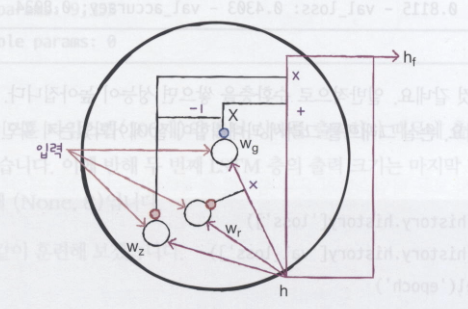

* GRU 셀에는 은닉 상태와 입력에 가중치를 곱하고 절편을 더하는 작은 셀이 3개 들어 있습니다. 
* 2개는 시그모이드 활성화 함수를 사용하고 하나는 tanh 활성화 함수를 사용합니다. 
* 여기에서도 은닉 상태와 입력에 곱해지는 가중치를 합쳐서 나타냈습니다. 
* 맨 왼쪽에서 ${w_z}$를 사용하는 셀의 출력이 은닉 상태에 바로 곱해져 삭제 게이트 역할을 수행합니다.
* 이와 똑같은 출력을 1에서 뺀 다음에 가장 오른쪽 ${w_g}$를 사용하는 셀의 출력에 곱합니다. 이는 입력되는 정보를 제어하는 역할을 수행합니다. 
* 가운데 ${w_r}$을 사용하는 셀에서 출력된 값은 ${w_g}$셀이 사용할 은닉 상태의 정보를 제어합니다. 

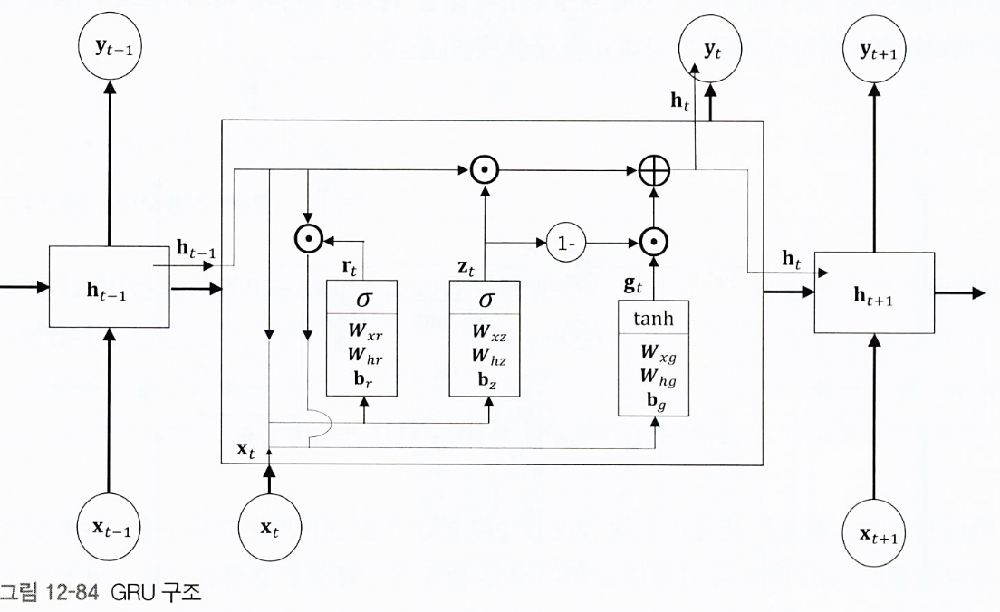

* GRU 셀은 LSTM보다 가중치가 적기 때문에 계산량이 적지만 LSTM 못지않은 좋은 성능을 내는 것으로 알려져 있습니다. 

In [56]:
model4 = keras.Sequential()

model4.add(keras.layers.Embedding(500, 16, input_length=100))
model4.add(keras.layers.GRU(8))
model4.add(keras.layers.Dense(1, activation='sigmoid'))

model4.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_4 (Embedding)      (None, 100, 16)           8000      
_________________________________________________________________
gru (GRU)                    (None, 8)                 624       
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 9         
Total params: 8,633
Trainable params: 8,633
Non-trainable params: 0
_________________________________________________________________


* GRU 셀에는 3개의 작은 셀이 있습니다. 
* 작은 셀에는 입력과 은닉 상태에 곱하는 가중치와 절편이 있습니다. 
* 입력에 곱하는 가중치는 16 x 8 = 128개이며 은닉 상태에 곱하는 가중치는 8 x 8 = 64개입니다. 
* 128 + 64 + 8(편향) = 200개 
* 이 셀이 3개이므로 모두 600개의 모델 파라미터가 필요합니다. 

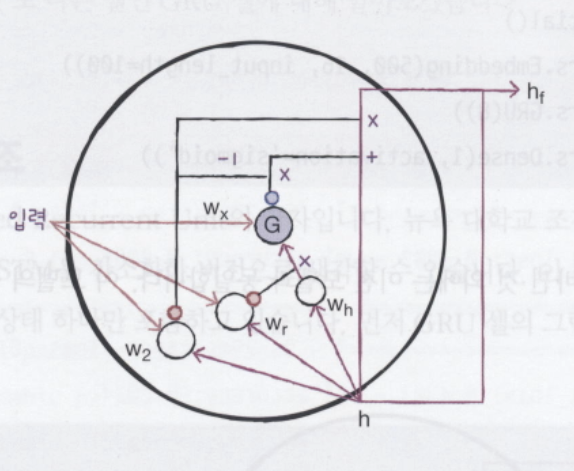

* 텐서플로에 기본적으로 구현된 GRU 셀의 계산은 앞의 그림과 다르게 위의 그림처럼 되어 있습니다

* 이런 구조 때문에 셀 하나당 8개의 편향이 필요하기 때문에 8 x 3 = 24개 파라미터가 더 필요합니다. 

In [57]:
rmsprop = keras.optimizers.RMSprop(learning_rate=1e-4)
model4.compile(optimizer=rmsprop, loss='binary_crossentropy', 
               metrics=['accuracy'])

checkpoint_cb = keras.callbacks.ModelCheckpoint('best-gru-model.h5')
early_stopping_cb = keras.callbacks.EarlyStopping(patience=3,
                                                  restore_best_weights=True)

history = model4.fit(train_seq, train_target, epochs=100, batch_size=64,
                     validation_data=(val_seq, val_target),
                     callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/100
313/313 [==============================] - 4s 9ms/step - loss: 0.6924 - accuracy: 0.5345 - val_loss: 0.6914 - val_accuracy: 0.5624
Epoch 2/100
313/313 [==============================] - 2s 8ms/step - loss: 0.6900 - accuracy: 0.5876 - val_loss: 0.6886 - val_accuracy: 0.6016
Epoch 3/100
313/313 [==============================] - 3s 8ms/step - loss: 0.6857 - accuracy: 0.6224 - val_loss: 0.6830 - val_accuracy: 0.6246
Epoch 4/100
313/313 [==============================] - 3s 8ms/step - loss: 0.6769 - accuracy: 0.6428 - val_loss: 0.6717 - val_accuracy: 0.6448
Epoch 5/100
313/313 [==============================] - 2s 8ms/step - loss: 0.6584 - accuracy: 0.6685 - val_loss: 0.6452 - val_accuracy: 0.6742
Epoch 6/100
313/313 [==============================] - 2s 8ms/step - loss: 0.6099 - accuracy: 0.7054 - val_loss: 0.5713 - val_accuracy: 0.7272
Epoch 7/100
313/313 [==============================] - 2s 8ms/step - loss: 0.5384 - accuracy: 0.7430 - val_loss: 0.5313 - val_accuracy: 0.7472

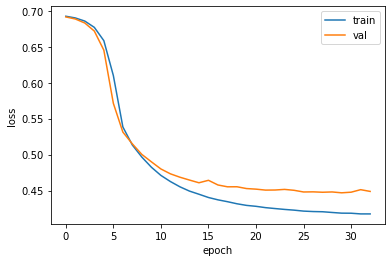

In [58]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train', 'val'])
plt.show()

## 마무리

In [59]:
test_seq = pad_sequences(test_input, maxlen=100)

rnn_model = keras.models.load_model('best-2rnn-model.h5')
# 텐서플로 2.3에서는 버그(https://github.com/tensorflow/tensorflow/issues/42890) 때문에 compile() 메서드를 호출해야 합니다.
# rnn_model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics='accuracy')

rnn_model.evaluate(test_seq, test_target)

782/782 [==============================] - 4s 5ms/step - loss: 0.4330 - accuracy: 0.7983


[0.4329758882522583, 0.7982800006866455]

# 문제 
## 문제 1
* 1. 다음 중 텐서플로에서 제공하는 순환층 클래스가 아닌 것은 무엇인가요? 
1. SimpleRNN
2. LSTM
3. GRU
4. Conv2D

## 문제 2
* LSTM 층에 있는 게이트가 아닌 것은 무엇인가요?
1. 순환 게이트 
2. 삭제 게이트 
3. 입력 게이트 
4. 출력 게이트 

## 문제 3
*  순환층을 2개 이상 쌓을 때 마지막 층을 제외하고는 모든 타입스텝의 은닉상태를 출력하기 위해 지정해야 하는 매개변수는 무엇인가요?(주관식)